In [1]:
import pandas as pd
import plotly
import plotly.express as px
import numpy as np
import plotly.graph_objects as go
import random
import matplotlib.pyplot as pltt

In [2]:
mapbat_df = pd.read_csv('/home/erik/SRC/research/mgr/results/MAPBAT_150623.csv')  

/tmp/ipykernel_20891/4141051662.py:1: DtypeWarning: Columns (14,15,16) have mixed types. Specify dtype option on import or set low_memory=False.
  mapbat_df = pd.read_csv('/home/erik/SRC/research/mgr/results/MAPBAT_150623.csv')


# Figure 1

In [2]:
plot1a = pd.read_pickle('../results/tables2plot/plofig1a.pkl')
plot1b = pd.read_pickle('../results/tables2plot/plofig1b.pkl') 
plot1c = pd.read_pickle('../results/tables2plot/plofig1c.pkl') 

In [21]:
fig =go.Figure(go.Sunburst(
    labels=["All patents", "Mixed origin", "Marine origin"],
    parents=["", "All patents", "All patents"],
    values=[plot1a[0], plot1a[1], plot1a[2]],
    textinfo='label+value'
))
fig.update_layout(margin = dict(t=0, l=0, r=0, b=0))
fig.update_layout(
     font=dict(
         family="Times New Roman",
         size=24,  # Set the font size here
         color="Black"
     )
 )

plotly.offline.plot(fig, image_filename='figure1a', image_width=1000, image_height=1000,
                        image='svg')

fig.show()

In [22]:
import plotly.graph_objects as go

fig =go.Figure(go.Sunburst(
    labels=["All species", "Marine species", "Terrestrial species"],
    parents=["", "All species", "All species"],
    values=[plot1b[0], plot1b[1], plot1b[2]],
    textinfo='label+value'
))
fig.update_layout(margin = dict(t=0, l=0, r=0, b=0))
fig.update_layout(
     font=dict(
         family="Times New Roman",
         size=24,  # Set the font size here
         color="Black"
     )
 )

plotly.offline.plot(fig, image_filename='figure1b', image_width=1000, image_height=1000,
                        image='svg')



fig.show()

In [6]:
fig = px.treemap(plot1c,
                 path=['marine_species', 'organism'],
                 values='appearance')

fig.update_layout(
                  width=1500, height=750)

fig.data[0].textinfo = 'label + percent entry'
fig.update_layout(
     font=dict(
         family="Times New Roman",
         size=24,  # Set the font size here
         color="Black"
     )
 )

fig.data[0].textinfo = 'none'

plotly.offline.plot(fig, image_filename='figure1c', image_width=1500, image_height=1000,
                        image='svg')

fig.show()

In [4]:
plot1c.organism.value_counts()[0:30]

arabidopsis thaliana           7645
zea mays                       6416
ciona intestinalis             5250
glycine max                    5092
homo sapiens                   4801
oryza sativa                   4608
brassica napus                 3509
gadus morhua                   3120
saccharomyces cerevisiae       2223
oryza sativa japonica group    2152
escherichia coli               2026
triticum aestivum              1947
influenza a virus              1699
mus musculus                   1371
hordeum vulgare                1247
anguilla japonica              1187
populus trichocarpa            1100
oreochromis niloticus          1046
sorghum bicolor                1020
solanum lycopersicum            852
medicago truncatula             787
physcomitrium patens            664
danio rerio                     607
rattus norvegicus               605
salmo salar                     601
nicotiana tabacum               590
drosophila melanogaster         588
gossypium hirsutum          

In [12]:
plot1c[plot1c.marine_species=='Terrestrial'].organism.value_counts()[0:5]/plot1c[plot1c.marine_species=='Terrestrial'].organism.value_counts().sum().sum()

arabidopsis thaliana    0.051543
zea mays                0.043257
glycine max             0.034330
homo sapiens            0.032368
oryza sativa            0.031067
Name: organism, dtype: float64

In [ ]:
marine = ['ciona intestinalis', 'gadus morhua', 'anguilla japonica', 'salmo salar', 'oncorhynchus mykiss']

In [13]:
non_marine = ['arabidopsis thaliana', 'zea mays', 'glycine max', 'homo sapiens', 'oryza sativa']

In [14]:
plot1c.organism.value_counts()[0:50]/plot1c.organism.value_counts().sum().sum()

arabidopsis thaliana                      0.043102
zea mays                                  0.036173
ciona intestinalis                        0.029599
glycine max                               0.028708
homo sapiens                              0.027068
oryza sativa                              0.025979
brassica napus                            0.019783
gadus morhua                              0.017590
saccharomyces cerevisiae                  0.012533
oryza sativa japonica group               0.012133
escherichia coli                          0.011422
triticum aestivum                         0.010977
influenza a virus                         0.009579
mus musculus                              0.007730
hordeum vulgare                           0.007030
anguilla japonica                         0.006692
populus trichocarpa                       0.006202
oreochromis niloticus                     0.005897
sorghum bicolor                           0.005751
solanum lycopersicum           

# Figure2

In [25]:
plot2 = pd.read_pickle('../results/tables2plot/plofig2.pkl')

In [26]:
fig = px.scatter(plot2, x='log2_av_length', y='log2_sequences', color='% of proteins', size = 'num_of_patents',\
                size_max = 75, opacity=0.8,
                labels={
                     "log2_av_length": "median sequence length (log2)",
                     "log2_sequences": "count of unique sequences (log2)"},
                 )
fig.update_layout(showlegend=False)

fig.update_layout(
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(1,1,0,0)',
    legend=dict(
                           yanchor="top",
                           y=0.99,
                           xanchor="left",
                           x=0.01
                    )
)

fig.update_xaxes(range = [3.9,12.5])

## determine outliers using whatever method you like
outliers = plot2.loc[(plot2["log2_sequences"] > 7.96), ["log2_av_length","log2_sequences",'company']]
print(outliers.company.to_list())

outliers_coordsx = [0,0,0,0,0,-5,5,18,2,-15,-2,-9,-2,-2,15]
outliers_coordsy = [50,12,3,6,10,10,5,16,7,0,32,12,2,3,17]
outliers_dictx = dict(zip(outliers['company'], outliers_coordsx))
outliers_dicty = dict(zip(outliers['company'], outliers_coordsy))

outliers_dict = {'BASF': 'BASF [DE]',
                 'JST':'JST [JP]',
                'GENOME ATLANTIC [CA]': 'GENOME ATLANTIC [CA]',
                'FISHERIES RESEARCH AGENCY': 'FRA [JP]',
                'EW GROUP GMBH': 'EW GROUP [DE]',
                'UNIVERSITY OF UTAH': 'UNIVERSITY OF UTAH [US]',
                'YEDA': 'YEDA [IL]',
                'KIOST': 'KIOST [KR]',
                'OXFORD GENE TECHNOLOGY IP LIMITED (GB)': 'OGT [UK]',
                'KYOWA HAKKO': 'KHK [JP]',
                'DSM IP ASSETS BV': 'DSN [NL]',
                'KANEKA CORP': 'KANEKA CORP [JP]',
                'GENE STREAM PTY LTD': 'GS [AU]',
                'GENOMAR': 'GENOMAR [NO]',
                'IFF': 'IFF [US]'}

#'DU PONT': 'DU PONT [US]',


## add text to outliers using their (x,y) coordinates:
for x,y,z in outliers.itertuples(index=False):
    fig.add_annotation(
        x=x, y=y,
        text=outliers_dict[z],
        showarrow=True,
        arrowhead=2,
        arrowsize=1,
        arrowwidth=1,
        ay=-30,
        xshift=outliers_dictx[z],
        yshift=outliers_dicty[z],
        font=dict(
            family="Courier New, monospace",
            size=18,
            color="black"
            )
    )

fig.add_vline(x=7.22, line_width=3, line_dash="dash", line_color="black",
             annotation_text="", annotation_position="left", annotation_textangle = 0,
            fillcolor="grey", opacity=0.25,
              annotation=dict(font_size=20, font_color='red', font_family="Times New Roman"))

fig.add_hline(y=4, line_width=1, line_color="black",
             annotation_text="", annotation_position="left", annotation_textangle = 0,
            fillcolor="black", opacity=1,
              annotation=dict(font_size=20, font_color='red', font_family="Times New Roman"))


fig.add_vline(x=4, line_width=1, line_color="black",
             annotation_text="", annotation_position="left", annotation_textangle = 0,
            fillcolor="black", opacity=1,
              annotation=dict(font_size=20, font_color='red', font_family="Times New Roman"))


#fig.add_vline(x=8.22, line_width=3, line_dash="dash", line_color="black")

#fig.add_vrect(x0="4", x1="8.22", 
#              annotation_text="non-coding sequences", annotation_position="top left", annotation_textangle = 0,
#              fillcolor="grey", opacity=0.25, line_width=1, annotation=dict(font_size=20, font_color='red', font_family="Times New Roman"))

#fig.add_vrect(x0="7.22", x1="12.5", 
#              annotation_text="protein-coding sequences", annotation_position="top left", annotation_textangle = 0,
#              fillcolor="orange", opacity=0.25, line_width=1, annotation=dict(font_size=20, font_color='red', font_family="Times New Roman"))

list1 = [{**a, **{"arrowwidth":1.2}}  for a in fig.to_dict()["layout"]["annotations"][0:-1]]
list2 = [{**a, **{"x":10.65}}  for a in fig.to_dict()["layout"]["annotations"][-1::]]
two_lists = [list1, list2]
all_annotations = [item for sublist in two_lists for item in sublist]
fig.update_layout(annotations=all_annotations)
    
#print(list2)        
#print(fig.to_dict()["layout"]["annotations"])
#print(all_annotations)

fig.update_layout(
                  width=1200, height=900)

fig.update_layout(
     font=dict(
         family="Times New Roman",
         size=24,  # Set the font size here
         color="Black"
     )
 )

plotly.offline.plot(fig, image_filename='figure2', image_width=1500, image_height=1000,
                        image='svg')

fig.show()

#print(fig.to_dict()["layout"]["annotations"])

['BASF', 'JST', 'GENOME ATLANTIC [CA]', 'FISHERIES RESEARCH AGENCY', 'EW GROUP GMBH', 'UNIVERSITY OF UTAH', 'YEDA', 'KIOST', 'OXFORD GENE TECHNOLOGY IP LIMITED (GB)', 'KYOWA HAKKO', 'DSM IP ASSETS BV', 'KANEKA CORP', 'GENE STREAM PTY LTD', 'GENOMAR', 'IFF']


# Figure 3

In [27]:
plot3a = pd.read_pickle('../results/tables2plot/plotfig3a.pkl')

In [28]:
import plotly.express as px
data = dict(
    character=["Without", "With proteins", "Top 100 applicants", str(plot3a[0]-100)+ " applicants"],
    parent=["", "", "With proteins", "With proteins"],
    value=[plot3a[1], 0,
           plot3a[2], plot3a[3]])

#print(data)

fig = px.sunburst(
    data,
    names='character',
    parents='parent',
    values='value',
    height = 900,
 template = 'ggplot2')
    
fig.update_traces(textinfo="label+percent parent")

fig.update_layout(xaxis_title="%",
        font=dict(
        family="Times New Roman",
        size=32,
        color="Black"
    ), height=900, paper_bgcolor="rgba(255,255,255,1)", plot_bgcolor="rgba(255,255,255,1)")

fig.update_traces(insidetextorientation='horizontal', rotation=52)

fig.update_traces(
    marker_colors=['#819FBD', '#FFAA00','gold','#FFAA00'],
    leaf_opacity=1,
)

plotly.offline.plot(fig, image_filename='figure3a', image_width=1500, image_height=1000,
                        image='svg')

fig.show()


In [2]:
plot3b = pd.read_pickle('../results/tables2plot/plotfig3b.pkl')

plot3b = plot3b[0]

In [3]:
plot3b

[1696.6196569842325, 687.4291186189027, 243.7526230924475, 85.45494949494949]

In [30]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import numpy as np

fig = make_subplots(1, 1, specs=[[{'type':'pie'}]],
                    horizontal_spacing = 0.05,
                   vertical_spacing = 0.05)


fig.add_trace(go.Pie(labels=['Multinational', 'University', 'National', 'Government'], values=[plot3b[0],plot3b[1],plot3b[2],85]*5, hole=.5,
                     title='Top 100 applicants'+'\n'+str(int(np.round(sum([plot3b[0],plot3b[1],plot3b[2],85]),0)))+(' patents'),
                      scalegroup='one'*2),
                      row=1, col=1)


fig.update_layout(xaxis_title="%",
        font=dict(
        family="Times New Roman",
        size=32,
        color="Black"
    ), height=900, paper_bgcolor="rgba(255,255,255,1)", plot_bgcolor="rgba(255,255,255,1)")

fig.update_traces(insidetextorientation='horizontal', rotation=52)

fig.update_traces(
    marker_colors=['#862780', '#0d955f','#dc706b','pink'],
)

plotly.offline.plot(fig, image_filename='figure3b', image_width=1500, image_height=1000,
                        image='svg')

fig.show()

In [31]:
int(np.round(3.1222, 0))

3

# Figure 3C

In [32]:
plot3c = pd.read_pickle('../results/tables2plot/plotfig3c.pkl')


In [33]:
plot3c

,country,num_of_patents,patents_predicted
9,JAPAN,601,287.606570
16,US,462,228.786325
5,GERMANY,318,209.260000
10,KOREA,98,73.613232
11,NETHERLANDS,63,40.710000
14,SWITZERLAND,50,23.430000
4,FRANCE,44,27.703750
15,UK,28,16.620000
3,DENMARK,28,15.150000
0,AUSTRALIA,27,12.440000


In [34]:
jap_ger_us = plot3c[plot3c.country.isin(['JAPAN', 'US', 'GERMANY'])].num_of_patents.sum()+plot3c[plot3c.country.isin(['JAPAN', 'US', 'GERMANY'])].patents_predicted.sum()
all3c = plot3c.num_of_patents.sum()+plot3c.patents_predicted.sum()
jap_ger_us/all3c

0.7764297305280384

In [35]:
plt.rcParams.update({'font.size': 20})

fig = make_subplots(rows=1, cols=1,
                    shared_xaxes=True,
                    vertical_spacing=0.02)
x=plot3c['country']
#fig.add_trace(go.Bar(x=x, y=new_df_figure4_plot['Owner same as commercial operator']*new_df_figure4_plot['count']/100,
#                     name='Owner same as commercial operator', legendgroup='1'),row=1, col=1)
#fig.add_trace(go.Bar(x=x, y=new_df_figure4_plot['Different owner']*new_df_figure4_plot['count']/100, name='Different owner', legendgroup='1'),row=1, col=1)
fig.add_trace(go.Bar(x=x, y=plot3c['num_of_patents'], name='Patents present', legendgroup='2'),row=1, col=1)
fig.add_trace(go.Bar(x=x, y=plot3c['patents_predicted'], name='Patents predicted', legendgroup='2'),row=1, col=1)


#fig.update_yaxes(title_text="Number of vessels", row=1, col=1)
fig.update_yaxes(title_text="Number of patents", row=2, col=1)

fig.update_layout(barmode='stack', xaxis={'categoryorder':'array', 'categoryarray':x})
fig.update_layout(legend_tracegroupgap=180)
fig.update_yaxes(nticks=10)

fig.update_layout(height=1000, width=1500, template="simple_white")

fig.update_yaxes( # the y-axis is in dollars
showgrid=True
)

fig.update_layout(barmode="stack", font=dict(
        family="Times New Roman",
        size=28,
        color="Black"
    ))

# fig.layout.annotations[1].update(text="", font=dict(
#         family="Times New Roman",
#         size=28,
#         color="Black"
#     ))

# fig.update_traces(
#     textposition='outside',
#     texttemplate='%{y}', 
    
# )
fig['layout']['xaxis']['title']='Country'
fig['layout']['yaxis']['title']='Number of patents'


plotly.offline.plot(fig, image_filename='fig4', image_width=1500, image_height=1000,
                         image='svg')
# # edit axis labels
# fig['layout']['xaxis']['title']='Year'
# fig['layout']['xaxis2']['title']='Year'
# fig['layout']['yaxis']['title']='Number of reefer vessels'
# fig['layout']['yaxis2']['title']='Number of encounters'

fig.show()

AttributeError: 'AxesSubplot' object has no attribute 'rcParams'

# Figure 4A

In [4]:
soi_df = pd.read_pickle('../results/tables2plot/plofig5a.pkl')
top_comp_4a = ['BASF',
 'DU PONT',
 'BAYER',
 'DSM IP ASSETS BV',
 'TAKARA HOLDINGS',
 'AIST',
 'KAO CORPORATION',
 'IFF',
 'AJINOMOTO',
 'CHEVRON']

In [5]:
soi_df = soi_df[soi_df.company.isin(top_comp_4a)]
companies2countries_dict = {'BASF': 'GERMANY', 'DU PONT': 'US', 'BAYER': 'GERMANY',
                 'DSM IP ASSETS BV': 'NETHERLANDS', 'TAKARA HOLDINGS': 'JAPAN', 
                 'AIST': 'JAPAN', 'KAO CORPORATION': 'JAPAN', 'IFF': 'US',
                 'AJINOMOTO': 'JAPAN', 'CHEVRON': 'US'}

soi_df['country'] = soi_df['company'].map(companies2countries_dict)

soi_df['company'] = soi_df['company'].str.replace(r'DU PONT',
                                                                'DuPont', regex=True)
soi_df['company'] = soi_df['company'].str.replace(r'BAYER',
                                                                'Bayer AG', regex=True)

soi_df['company'] = soi_df['company'].str.replace(r'CHEVRON',
                                                                'Chevron', regex=True)
soi_df['company'] = soi_df['company'].str.replace(r'KAO CORPORATION',
                                                                'Kao Corporation', regex=True)
soi_df['company'] = soi_df['company'].str.replace(r'AJINOMOTO',
                                                                'Ajinomoto Co., Inc.', regex=True)
soi_df['company'] = soi_df['company'].str.replace(r'TAKARA HOLDINGS',
                                                                'Takara Holdings Inc.', regex=True)
soi_df['company'] = soi_df['company'].str.replace(r'DSM IP ASSETS BV',
                                                                'DSM N.V.', regex=True)

region_colors = {'Germany':'red','USA':'blue',
                 'Japan':'cyan', 'The Netherlands':'purple', 'France': 'green'}

In [6]:
soi_df = soi_df[soi_df.Domain != 'NA']
soi_df = soi_df[soi_df.Deep_sea != 'na']

soi_df.Deep_sea = soi_df.Deep_sea.apply(str)
    
soi_df.Deep_sea = soi_df.Deep_sea.replace(['0'],'Other species')
soi_df.Deep_sea = soi_df.Deep_sea.replace(['1'],'Deep-sea')
soi_df = soi_df[soi_df.Deep_sea == 'Deep-sea']

In [20]:
soi_df

,id,locus,organism,definition,journal,filename,origin,year,patent,company,...,Domain,Phylum,source,Deep_sea,Deep_sea_source,appearance,protein_origin,num_of_stop_codons,valid_protein,country
103,6941953,LOCUS CS362721 37 bp ...,thermotoga maritima,DEFINITION Sequence 43 from Patent WO2006012080.,JOURNAL Patent: WO 2006012080-A2 43 02-FEB-2...,gbpat13.seq.gz,ctgatctgatcatcatgatatcaccactctctccagc,2006,Patent: WO,Bayer AG,...,Bacteria,Thermotogae,WoRMS,Deep-sea,2018,1,LI*SS*YHHSLQ,2,False,GERMANY
107,8078578,LOCUS JC452409 1200 bp ...,thermotoga maritima,DEFINITION Sequence 82 from Patent EP2479272.,JOURNAL Patent: EP 2479272-A1 82 25-JUL-2012...,gbpat135.seq.gz,atggatgtctttagcgaccgtgtcctgctgaccgaagaatcaccga...,2012,Patent: EP,"Ajinomoto Co., Inc.",...,Bacteria,Thermotogae,WoRMS,Deep-sea,2018,1,MDVFSDRVLLTEESPIRKLVPFAEMAKKRGVRIHHLNIGQPDLKTP...,1,True,JAPAN
115,16301585,LOCUS DD234858 1452 bp ...,thermotoga maritima,DEFINITION Heat-resistance Arabino-Furanosidase.,JOURNAL Patent: JP 2005287402-A 1 20-OCT-200...,gbpat17.seq.gz,atgtcctacgggatagtggtggatccaaaagaagttgtcaagccga...,2005,Patent: JP,AIST,...,Bacteria,Thermotogae,WoRMS,Deep-sea,2018,1,MSYGIVVDPKEVVKPISRHIYGHFTEHLGRCIYGGIYEEGSPLSDE...,0,True,JAPAN
139,46191304,LOCUS BD142767 714 bp ...,thermotoga maritima,DEFINITION WO 2002022831-A/49: Thermostable r...,JOURNAL Patent: WO 2002022831-A 49 21-MAR-20...,gbpat7.seq.gz,atgggaatagatgagctttacaaaaaagagtttggaatcgtagcag...,2002,Patent: WO,Takara Holdings Inc.,...,Bacteria,Thermotogae,WoRMS,Deep-sea,2018,1,MGIDELYKKEFGIVAGVDEAGRGCLAGPVVAAAVVLEKEIEGINDS...,0,True,JAPAN
142,51285689,LOCUS HC005030 1335 bp ...,thermotoga maritima,DEFINITION Sequence 1 from Patent WO2009109631.,JOURNAL Patent: WO 2009109631-A1 1 11-SEP-20...,gbpat88.seq.gz,atggcagaatttttcccagaaatcccaaagattcagtttgaaggta...,2009,Patent: WO,DSM N.V.,...,Bacteria,Thermotogae,WoRMS,Deep-sea,2018,1,MAEFFPEIPKIQFEGKESTNPLAFRFYDPNEVIDGKPLKDHLKFSV...,1,True,NETHERLANDS
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3780,51611813,LOCUS HC753046 1275 bp ...,thermosipho melanesiensis bi429,DEFINITION Sequence 10137 from Patent WO20100...,JOURNAL Patent: WO 2010046221-A1 10137 29-AP...,gbpat89.seq.gz,gtgtgggaaaatgtaaaaaaagttgatcctgagatatacgaagtta...,2010,Patent: WO,BASF,...,Bacteria,Thermotogota,Wikipedia,Deep-sea,2018,1,VWENVKKVDPEIYEVILKEWDRQEYGLELIASENFASLAVIEAMGS...,1,True,GERMANY
3781,51612167,LOCUS HC753760 600 bp ...,nitratiruptor sp. sb155-2,DEFINITION Sequence 10851 from Patent WO20100...,JOURNAL Patent: WO 2010046221-A1 10851 29-AP...,gbpat89.seq.gz,atgctcgttactaaaaaagcacctgactttacggcaccagcagtta...,2010,Patent: WO,BASF,...,Bacteria,Campylobacterota,Wikipedia,Deep-sea,https://img.jgi.doe.gov/cgi-bin/m/main.cgi?sec...,1,MLVTKKAPDFTAPAVMPDNTINENFNLYENIGEKGAVLFFYPLDFT...,1,True,GERMANY
3786,51611998,LOCUS HC753416 1254 bp ...,shewanella sp. w3-18-1,DEFINITION Sequence 10507 from Patent WO20100...,JOURNAL Patent: WO 2010046221-A1 10507 29-AP...,gbpat89.seq.gz,atgctgaaaaaagatatgaatatcgcagattatgatccggaactgt...,2010,Patent: WO,BASF,...,Bacteria,Pseudomonadota,Wikipedia,Deep-sea,https://img.jgi.doe.gov/cgi-bin/m/main.cgi?sec...,1,MLKKDMNIADYDPELFNAIQNETLRQEEHIELIASENYTSPRVMEA...,1,True,GERMANY
3809,53653888,LOCUS HH771168 1254 bp ...,sphaerechinus granularis,DEFINITION Sequence 7355 from Patent EP2221382.,JOURNAL Patent: EP 2221382-A2 7355 25-AUG-20...,gbpat93.seq.gz,atgatggctcataccacaagaaattcaaatatgaactctcttggtt...,2010,Patent: EP,BASF,...,Eukaryota,Echinodermata,WoRMS,Deep-sea,WoRDSS,1,MMAHTTRNSNMNSLGLKKLQSFDNENAGARLGAKSMAVQKPAQRAA...,1,True,GERMANY


In [7]:
soi_df.Domain = soi_df.Domain.apply(str)
soi_df.Domain = soi_df.Domain.apply(lambda x: x.upper())
    
vals = soi_df.groupby(['patent_num', 'Domain']).size().to_frame().sort_values([0], ascending = False).reset_index()[0].to_list()
keys = soi_df.groupby(['patent_num', 'Domain']).size().to_frame().sort_values([0], ascending = False).reset_index()['Domain'].to_list()
org_pop = dict(zip(keys, vals))
    #print(org_pop)
    #pandas_df.company = pandas_df.company.apply(lambda x: str(x)[0:30])
soi_df['type_popularity'] = soi_df['Domain'].map(org_pop)
    #pandas_df = pandas_df[pandas_df['type_popularity']>=threshold]
soi_df = soi_df.sort_values('year', ascending = False)

pandas_df_gb = soi_df.groupby(['Domain', 'Deep_sea', 'company', 'country']).size().reset_index(name='Freq')

pandas_df_gb = pandas_df_gb.sort_values('Freq', ascending = False)
    #print(pandas_df_gb)
    
df3 = (
    pd.concat(
        [
            pandas_df_gb.loc[:, [c1, c2] + ["Freq"]].rename(
                columns={c1: "source", c2: "target"}
            )
            for c1, c2 in zip(pandas_df_gb.columns[:-1], pandas_df_gb.columns[1:-1])
        ]
    )
    .groupby(["source", "target"], as_index=False)
    .sum()
)

df3.source = df3.source.apply(str)
    
df3

,source,target,Freq
0,AIST,JAPAN,20
1,ARCHAEA,Deep-sea,63
2,"Ajinomoto Co., Inc.",JAPAN,8
3,BACTERIA,Deep-sea,74
4,BASF,GERMANY,69
5,Bayer AG,GERMANY,7
6,Chevron,US,1
7,DSM N.V.,NETHERLANDS,8
8,Deep-sea,AIST,20
9,Deep-sea,"Ajinomoto Co., Inc.",8


In [8]:
pandas_df_gb

,Domain,Deep_sea,company,country,Freq
10,BACTERIA,Deep-sea,BASF,GERMANY,31
2,ARCHAEA,Deep-sea,BASF,GERMANY,26
15,BACTERIA,Deep-sea,IFF,US,21
19,EUKARYOTA,Deep-sea,BASF,GERMANY,12
7,ARCHAEA,Deep-sea,Takara Holdings Inc.,JAPAN,11
18,EUKARYOTA,Deep-sea,AIST,JAPAN,9
0,ARCHAEA,Deep-sea,AIST,JAPAN,8
14,BACTERIA,Deep-sea,DuPont,US,7
4,ARCHAEA,Deep-sea,DSM N.V.,NETHERLANDS,7
9,BACTERIA,Deep-sea,"Ajinomoto Co., Inc.",JAPAN,4


In [21]:
def sankey_diagram_types_companies1(pandas_df, savefile):
    
    
    pandas_df.Domain = pandas_df.Domain.apply(str)
    pandas_df.Domain = pandas_df.Domain.apply(lambda x: x.upper())
    
    vals = pandas_df.groupby(['patent_num', 'Domain']).size().to_frame().sort_values([0], ascending = False).reset_index()[0].to_list()
    keys = pandas_df.groupby(['patent_num', 'Domain']).size().to_frame().sort_values([0], ascending = False).reset_index()['Domain'].to_list()
    org_pop = dict(zip(keys, vals))
    #print(org_pop)
    #pandas_df.company = pandas_df.company.apply(lambda x: str(x)[0:30])
    pandas_df['type_popularity'] = pandas_df['Domain'].map(org_pop)
    #pandas_df = pandas_df[pandas_df['type_popularity']>=threshold]
    pandas_df = pandas_df.sort_values('year', ascending = False)

    pandas_df_gb = pandas_df.groupby(['Domain', 'Deep_sea', 'company', 'country']).size().reset_index(name='Freq')

    pandas_df_gb = pandas_df_gb.sort_values('Freq', ascending = False)
    #print(pandas_df_gb)
    
    df3 = (
    pd.concat(
        [
            pandas_df_gb.loc[:, [c1, c2] + ["Freq"]].rename(
                columns={c1: "source", c2: "target"}
            )
            for c1, c2 in zip(pandas_df_gb.columns[:-1], pandas_df_gb.columns[1:-1])
        ]
    )
    .groupby(["source", "target"], as_index=False)
    .sum()
)

    df3.source = df3.source.apply(str)
    df3.target = df3.target.apply(str)
    
    nodes = np.unique(df3[["source", "target"]], axis=None)
    
    nodes = pd.Series(index=nodes, data=range(len(nodes)))
    print(nodes.index)
#     print(nodes.domain.x)
#     print(nodes.y)
    
#     nodes.index = ['AIST', 'AJINOMOTO', 'ARCHAEA', 'BACTERIA', 'BASF', 'BAYER', 'CHEVRON',
#        'DSM IP ASSETS BV', 'DU PONT', 'Deep-sea', 'EUKARYOTA', 'IFF',
#        'KAO CORPORATION', 'KIOST',
#        'NOVOZYMES', 'Other species', 'SCRIPPS RESEARCH INSTITUTE',
#        'SEKISUI CHEMICAL', 'TAKARA HOLDINGS', 'TOYOBO CO LTD', 'VIRUSES']

    
    color = ["#449464","#80391e","purple","#b97455","purple",
            "purple","purple","purple","#4b66a1","purple",
            "#e07b39","red","purple","#449464","orange", "purple",
            "yellow","#8aaeda","purple","blue","black"]
    fig = go.Figure(
    go.Sankey(arrangement='snap',
        node={"pad": 40, "label": nodes.index, "color": color},
        link={
            "source": nodes.loc[df3["source"]],
            "target": nodes.loc[df3["target"]],
            "value": df3["Freq"],
        },
    )
)

    fig.update_layout(hovermode = 'x',
                     height=1000, width=1000, font=dict(
            color='#051c2c'), font_size=18),
    fig.show()
    
  #  fig.savefig(savefile)
    
    plotly.offline.plot(fig, image_filename='fig4a', image_width=1000, image_height=1000,
                        image='svg')

    ### might need to wait for plot to download before copying
#     time.sleep(1)

#     copyfile('{}/{}.svg'.format(dload, img_name),
#          '{}/{}.svg'.format(save_dir, img_name))
    
    
    return

sankey_diagram_types_companies1(soi_df, 'fig4a.svg')

Index(['AIST', 'ARCHAEA', 'Ajinomoto Co., Inc.', 'BACTERIA', 'BASF',
       'Bayer AG', 'Chevron', 'DSM N.V.', 'Deep-sea', 'DuPont', 'EUKARYOTA',
       'GERMANY', 'IFF', 'JAPAN', 'Kao Corporation', 'NETHERLANDS',
       'Takara Holdings Inc.', 'US'],
      dtype='object')


# Figure 4B

In [15]:
import plotly.graph_objects as go

fig = go.Figure()
fig.add_trace(go.Bar(
    y=['BBNJ-specific', 'all WoRMS species'],
    x=[61, 85],
    name='Not deep-sea',
    orientation='h',
    marker=dict(
        color='rgba(114, 159, 207, 0.8)',
    )
))
fig.add_trace(go.Bar(
    y=['BBNJ-specific', 'all WoRMS species'],
    x=[39, 15],
    name='Deep-sea',
    orientation='h',
    marker=dict(
        color='rgba(32, 74, 135, 0.8)',
    )
))

fig.update_layout(xaxis_title="%",
        barmode='stack',
        font=dict(
        family="Times New Roman",
        size=26,
        color="Black"
    ), height=300, paper_bgcolor="rgba(255,255,255,1)", plot_bgcolor="rgba(255,255,255,1)")

plotly.offline.plot(fig, image_filename='figure', image_width=1336, image_height=300,
                        image='svg')

#fig.write_image(file='../results/plots/plots_for_manuscript/Figure5/Figure5B.png',
#                format='png')
fig.show()

# Supplementary figures

## Figure S1

In [226]:
plotS1 = pd.read_pickle('../results/tables2plot/plofigS1.pkl')
plotS1d = pd.read_pickle('../results/tables2plot/genbank_marine_species_v4_figS1d.pkl')

In [227]:
names = plotS1.company.to_list()
locs = [0,10,20,30,40,50,60,70,80,90,100]
pos = dict(zip(names,locs))

plotS1d['location'] = plotS1d.company.map(pos)
plotS1d['real'] = 1
plotS1d = plotS1d.sort_values(by='location', ascending=True)

plotS1d['patent'] = plotS1d['patent'].str.replace(r'Patent: EP', 'EPO', regex=True)
plotS1d['patent'] = plotS1d['patent'].str.replace(r'Patent: JP', 'JPO', regex=True)
plotS1d['patent'] = plotS1d['patent'].str.replace(r'Patent: KR', 'KIPO', regex=True)
plotS1d['patent'] = plotS1d['patent'].str.replace(r'Patent: WO', 'WIPO', regex=True)

In [228]:
plotS1d_g = plotS1d.groupby(['company', 'location','patent']).size().reset_index()
plotS1d_g['percentage'] = plotS1d.groupby(['company', 'patent']).size().groupby(level=0).apply(lambda x: 100 * x / float(x.sum())).values
plotS1d_g.columns = ['company', 'location','patent', 'counts', 'percentage']

plotS1d_g.loc[-1] = ['KAO CORPORATION', 60, 'EPO',0,0]
plotS1d_g = plotS1d_g.sort_values(by='location', ascending=True)
# px.bar(plotS1d_g, x="company", y='counts',color="patent",
#             barmode="stack", template="simple_white", title = 'Number of sequences').update_layout(autosize=False, width=500)

In [230]:
from plotly.subplots import make_subplots

fig = make_subplots(rows=2, cols=2, subplot_titles=("", "",
                                                   "", ""))
#bar1 = px.bar(big_df1, x = "unified_commercial_operator", y = "encounters", color="unified_company_of_interest_country")
bar1 = px.bar(plotS1, x = "company", y = "num_of_sequences", title = '', template="simple_white")
bar2 = px.bar(plotS1, x = "company", y = "num_of_patents", title = 's', template="simple_white")
bar3 = px.bar(plotS1, x = "company", y = "median_year", title = '', template="simple_white")
#bar4 = px.bar(plotS1, x = "company", y = "median_seq_length", title = 'Number of sequences', template="simple_white")
bar4 = px.bar(plotS1d_g, x="company", y='counts',color="patent",
            barmode="stack", template="simple_white", title = 'Number of sequences').update_layout(autosize=False, width=600)

#bar1.update_layout(xaxis = {"categoryorder":"total descending"})
#bar2.update_layout(xaxis = {"categoryorder":"total descending"})
#bar2.update_layout(xaxis = {"categoryorder":"total descending"})
#bar2.update_layout(xaxis = {"categoryorder":"total descending"})

#for trace in bar1.data:
#    fig.add_trace(trace, 1, 1)
for trace in bar1.data:
    fig.add_trace(trace, 1, 1)
for trace in bar2.data:
    fig.add_trace(trace, 1, 2)
for trace in bar3.data:
    fig.add_trace(trace, 2, 1)
for trace in bar4.data:
    fig.add_trace(trace, 2, 2)


#title_text="Reefer encounters 2017-2022"
fig.update_layout(height=1000, width=1300, template="simple_white")
fig.update(layout_showlegend=True)

fig.update_yaxes( # the y-axis is in dollars
showgrid=True
)

fig.update_layout(barmode="stack", font=dict(
        family="Times New Roman",
        size=18,
        color="Black"
    ))


# fig.update_traces(
#     textposition='outside',
#     texttemplate='%{y}', 
    
# )

# edit axis labels
fig['layout']['xaxis']['title']='Company'
fig['layout']['xaxis2']['title']='Company'
fig['layout']['xaxis3']['title']='Company'
fig['layout']['xaxis4']['title']='Company'
fig['layout']['yaxis']['title']='Number of sequences'
fig['layout']['yaxis2']['title']='Number of patents'
fig['layout']['yaxis3']['title']='Median year of application'
fig['layout']['yaxis4']['title']='Number of patents'
fig.update_layout(yaxis3 = dict(range=[2004, 2020]))


plotly.offline.plot(fig, image_filename='figS1', image_width=1000, image_height=1300,
                         image='svg')

fig.show()


## Figure S2

In [44]:
plotS2a = pd.read_pickle('../results/tables2plot/plotfigS2a.pkl')

In [45]:
bioprospecting_df = plotS2a[0].head(10000)
bioprospecting_stats = plotS2a[1]

bioprospecting_df = bioprospecting_df.rename(columns={'gc_content':
                                              'GC content (%)',
                                              'seq_length':
                                              'Sequence length'})

bioprospecting_df.columns

Index(['id', 'locus', 'organism', 'definition', 'journal', 'filename',
       'origin', 'year', 'patent', 'company', 'patent_num', 'patent_url',
       'final_company', 'GC content (%)', 'Sequence length', 'valid_sequence',
       'Species', 'Domain', 'Phylum', 'source', 'Deep_sea', 'Deep_sea_source',
       'appearance', 'protein_origin', 'num_of_stop_codons', 'valid_protein'],
      dtype='object')

/tmp/ipykernel_17206/213951956.py:27: UserWarning:

Attempting to set identical left == right == 942.0 results in singular transformations; automatically expanding.



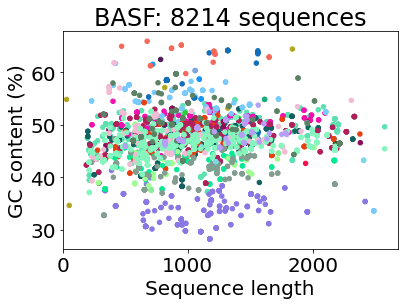

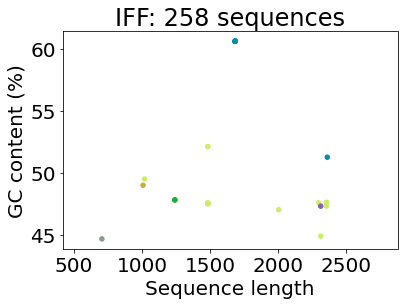

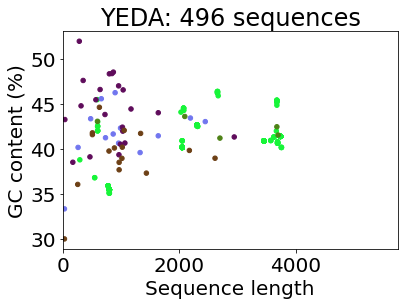

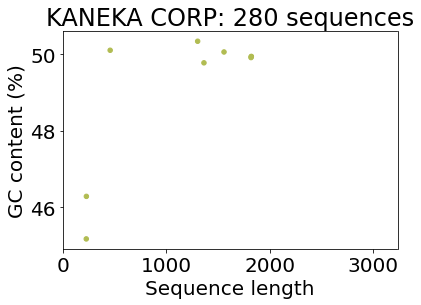

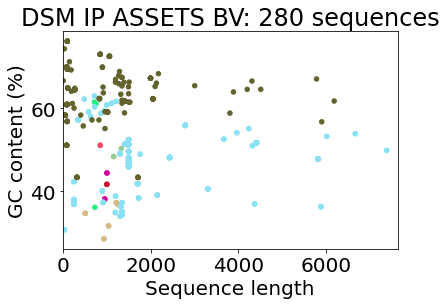

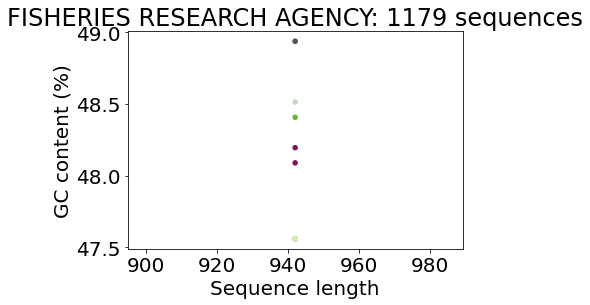

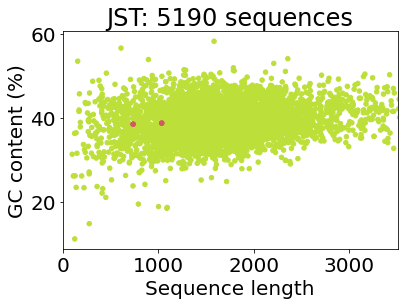

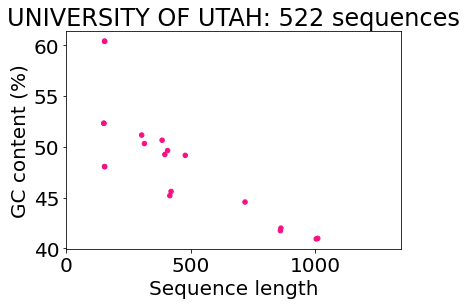

In [46]:
#'GC content (%)'
#'Sequence length'
pltt.rcParams.update({'font.size': 20})

for name in bioprospecting_df.company.drop_duplicates()[0:10]:
    test_df = bioprospecting_df[bioprospecting_df.company == name]
    stats_df = bioprospecting_stats[bioprospecting_stats.company == name].num_of_sequences
    
    unique_org = list(np.unique(test_df.organism))
    
    
    no_of_colors= len(unique_org)
    color=["#"+''.join([random.choice('0123456789ABCDEF') for i in range(6)])
       for j in range(no_of_colors)]
    color_dict = dict(zip(unique_org, color))
    
    plt = test_df.plot.scatter(x='Sequence length',

                      y='GC content (%)',
                                c=[color_dict[i] for i in test_df['organism'] ] ,
                               title = name + ': ' + str(int(stats_df)) + ' sequences')
    
    seq_length_vec = bioprospecting_df[bioprospecting_df.company == name]['Sequence length']
    seq_length_vec_coords = ([seq_length_vec.mean() - 3 * seq_length_vec.std(), seq_length_vec.mean() + 3 * seq_length_vec.std()])
    if seq_length_vec_coords[0]<0:
        seq_length_vec_coords[0] = 0
    plt.set_xlim(seq_length_vec_coords[0], seq_length_vec_coords[1])
    plt.set_facecolor('white')
    
    fig = plt.get_figure()

    name_of_the_file = 'FigS2A_'+str(name)+'fonts.svg'
    fig.savefig(name_of_the_file, facecolor=fig.get_facecolor(), transparent=False, pad_inches = 0.01)


In [104]:
plotS2b = pd.read_pickle('../results/tables2plot/plotfigS2b.pkl')

In [105]:
modification_df = plotS2b[0]
modification_stats = plotS2b[1]

modification_df = modification_df.rename(columns={'gc_content':
                                              'GC content (%)',
                                              'seq_length':
                                              'Sequence length'})

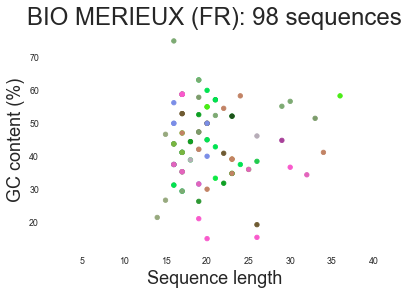

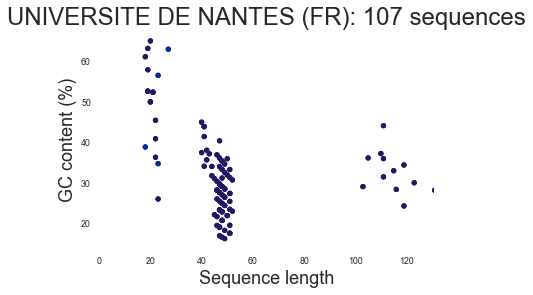

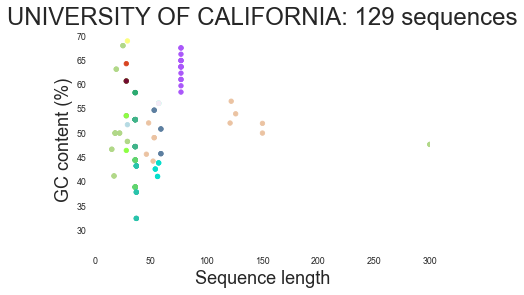

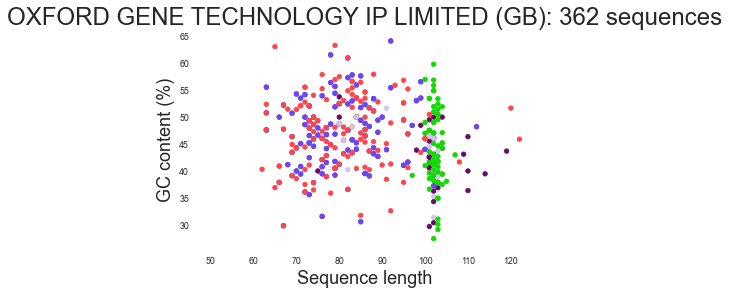

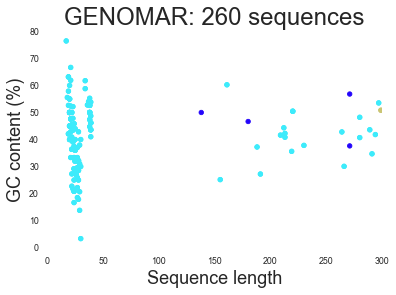

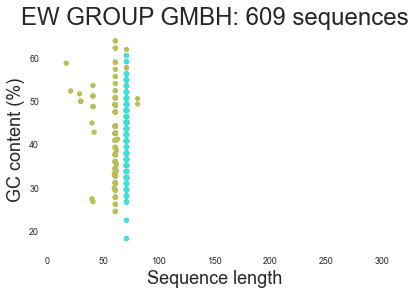

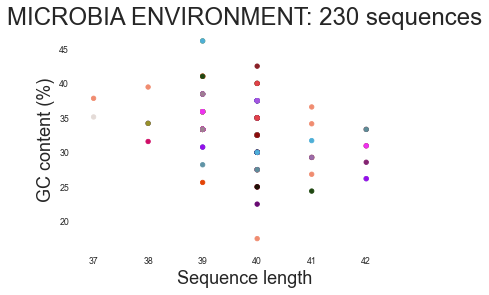

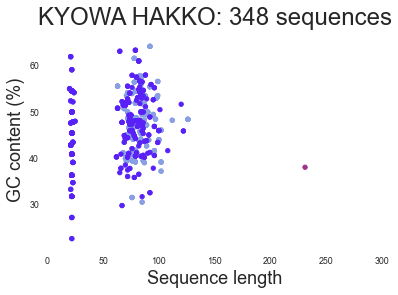

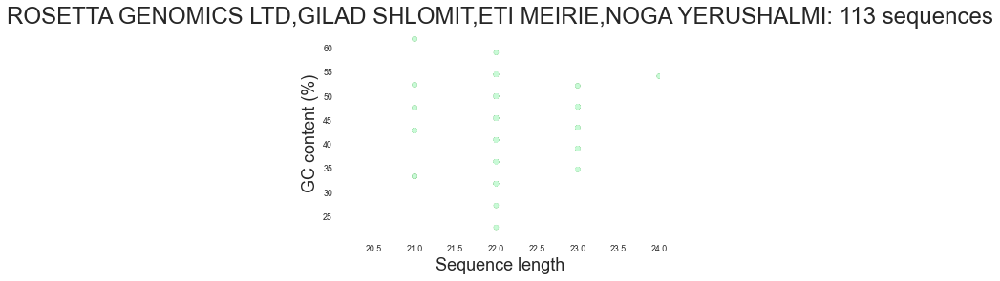

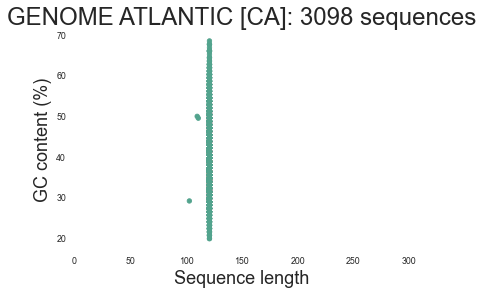

In [108]:
for name in modification_df.company.drop_duplicates():
    test_df = modification_df[modification_df.company == name]
    stats_df = modification_stats[modification_stats.company == name].num_of_sequences
    
    unique_org = list(np.unique(test_df.organism))
    
    
    no_of_colors= len(unique_org)
    color=["#"+''.join([random.choice('0123456789ABCDEF') for i in range(6)])
       for j in range(no_of_colors)]
    color_dict = dict(zip(unique_org, color))
    
    plt = test_df.plot.scatter(x='Sequence length',

                      y='GC content (%)',
                                c=[color_dict[i] for i in test_df['organism'] ] ,
                               title = name + ': ' + str(int(stats_df)) + ' sequences')
    
    seq_length_vec = modification_df[modification_df.company == name]['Sequence length']
    seq_length_vec_coords = ([seq_length_vec.mean() - 3 * seq_length_vec.std(), seq_length_vec.mean() + 3 * seq_length_vec.std()])
    if seq_length_vec_coords[0]<0:
        seq_length_vec_coords[0] = 0
    if int(seq_length_vec_coords[1])>300:
        seq_length_vec_coords[1] = 300
        
    plt.set_xlim(seq_length_vec_coords[0], seq_length_vec_coords[1])
    plt.set_facecolor('white')
    
    fig = plt.get_figure()

    name_of_the_file = 'FigS2B_'+str(name)+'.svg'
    fig.savefig(name_of_the_file, facecolor=fig.get_facecolor(), transparent=False, pad_inches = 0.01)
    #clara


## Figure S3

In [257]:
plotS3 = pd.read_pickle('../results/tables2plot/plotfigS3.pkl')

In [258]:
plotS3

,Patent bureau,Sequences with marine origin,Sequences with unknown origin
0,WIPO,27.17,4.82
1,USPTO,0.00,59.32
2,EPO,41.00,5.72
3,JPO,27.87,27.31
4,KIPO,4.97,3.82


In [14]:
plt.rcParams.update({'font.size': 20})

fig = make_subplots(rows=1, cols=1,
                    shared_xaxes=True,
                    vertical_spacing=0.02)
fig.add_trace(go.Bar(x=plotS3['Patent bureau'], y=plotS3['Sequences with marine origin'], name='Sequences with marine origin', legendgroup='2'),row=1, col=1)
fig.add_trace(go.Bar(x=plotS3['Patent bureau'], y=plotS3['Sequences with unknown origin'], name='Sequences with unknown origin', legendgroup='2'),row=1, col=1)


#fig.update_yaxes(title_text="Number of vessels", row=1, col=1)
fig.update_yaxes(title_text="%", row=2, col=1)

fig.update_layout(barmode='stack', xaxis={'categoryorder':'array', 'categoryarray':x})
fig.update_layout(legend_tracegroupgap=180)
fig.update_yaxes(nticks=10)

fig.update_layout(height=1000, width=1500, template="simple_white")

fig.update_yaxes( # the y-axis is in dollars
showgrid=True
)

fig.update_layout(barmode="stack", font=dict(
        family="Times New Roman",
        size=28,
        color="Black"
    ))

fig['layout']['xaxis']['title']='Patent system'
fig['layout']['yaxis']['title']='Percentage'


plotly.offline.plot(fig, image_filename='figS3', image_width=1000, image_height=1000,
                         image='svg')
fig.show()

AttributeError: 'AxesSubplot' object has no attribute 'rcParams'

## Figure S4

In [270]:
plotS4 = pd.read_pickle('../results/tables2plot/plofigS4.pkl')

In [271]:
saved_performance = [0.3051, 0.3067, 0.4312, 0.5384, 0.6708, 0.8321, 0.9324, 0.9548, 0.958, 0.3206, 0.3219, 0.4368, 0.5413, 0.6724, 0.8336, 0.9332, 0.9544, 0.9577, 0.3408, 0.342, 0.447, 0.5481, 0.6768, 0.8356, 0.9348, 0.9552, 0.9575, 0.3877, 0.3883, 0.4757, 0.5634, 0.6868, 0.8386, 0.9351, 0.9543, 0.9568, 0.5376, 0.5379, 0.5948, 0.6519, 0.7442, 0.8593, 0.9376, 0.9529, 0.9551]

In [272]:
plotS4[0]['perc_identified'] = saved_performance

In [287]:
plotS4[0]['perc_identified'] = pd.to_numeric(pd.cut(plotS4[0]['perc_identified'], bins=[0,0.20,0.40,0.60,0.70,0.80,0.90, 0.95], labels=[20,40,60,70,80,90,95]))

/home/erik/anaconda3/envs/mgr/lib/python3.8/site-packages/matplotlib/ticker.py:380: FutureWarning:

Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior



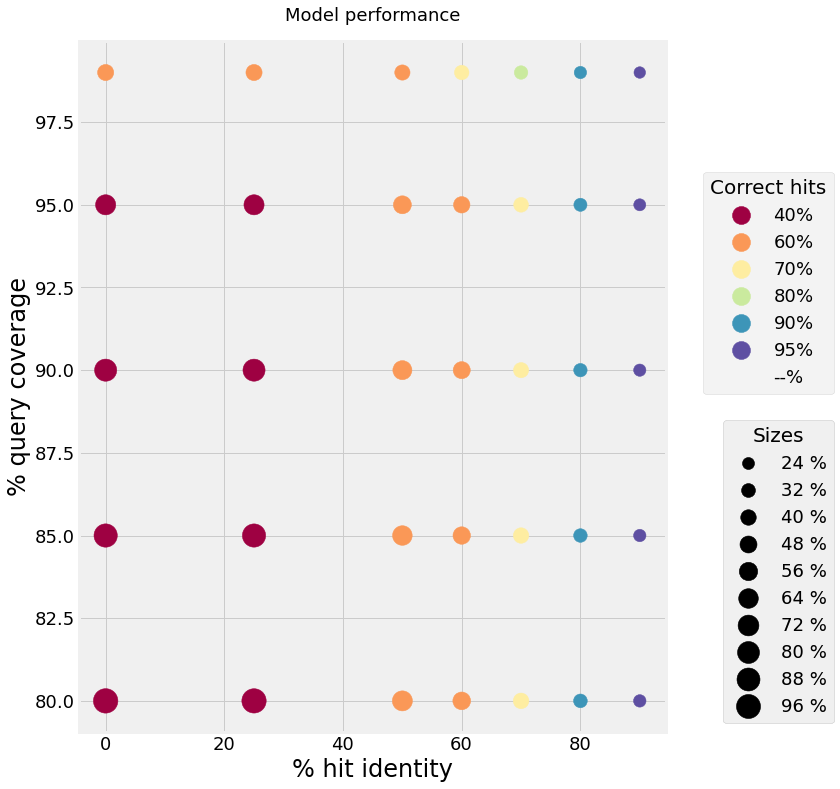

In [289]:
fig, ax = plt.subplots(figsize=(12, 12), facecolor='white')
scatter = ax.scatter(x = plotS4[0]['p_values'], y = plotS4[0]['q_values'],
           s = 0.3*(plotS4[0]['dataset_size']*100*20),
                     c = 0.3*(plotS4[0]['perc_identified']*50)**2,
                    cmap="Spectral")

kw1 = dict(prop="colors", fmt="{x:.0f}%",
          func=lambda s: np.sqrt(s/.3)/50)

legend1 = ax.legend(*scatter.legend_elements(**kw1),
                    loc="center right", title="Correct hits",  bbox_to_anchor=(1.3, 0.65), markerscale=3)

ax.add_artist(legend1)

kw2 = dict(prop="sizes", fmt="{x:.0f} %",
          func=lambda s: s/(.3*20))

legend2 = ax.legend(*scatter.legend_elements(**kw2),
                    loc="lower right", title="Sizes", bbox_to_anchor=(1.3, 0))

ax.add_artist(legend2)
ax.set_position([0.1,0.1,0.68,0.8])
ax.grid(True)
plt.xlabel("% hit identity")
plt.ylabel("% query coverage")
plt.title("Model performance", pad=20)
plt.savefig('marine_sequences_species_tag.svg', facecolor=fig.get_facecolor(), transparent=False, pad_inches = 0.01, bbox_extra_artists =[legend1, legend2])


In [293]:
plotS4[2].index

Index(['AIST', 'AJINOMOTO', 'BASF', 'BAYER', 'DSM IP ASSETS BV', 'DU PONT',
       'IFF', 'KAO CORPORATION', 'TAKARA HOLDINGS'],
      dtype='object', name='company')

In [307]:
plt.rcParams.update({'font.size': 20})

fig = make_subplots(rows=1, cols=2,
                    shared_xaxes=True,
                    vertical_spacing=0.02)
fig.add_trace(go.Bar(x=plotS4[1].index, y=plotS4[1]['with correct hits < 95%'], name='with correct hits < 95%', legendgroup='1'),row=1, col=1)
fig.add_trace(go.Bar(x=plotS4[1].index, y=plotS4[1]['with correct hits > 95%'], name='with correct hits ≥ 95%', legendgroup='1'),row=1, col=1)
fig.add_trace(go.Bar(x=plotS4[2].index, y=plotS4[2]['with correct hits < 95%'], name='with correct hits < 95%', legendgroup='2'),row=1, col=2)
fig.add_trace(go.Bar(x=plotS4[2].index, y=plotS4[2]['with correct hits > 95%'], name='with correct hits ≥ 95%', legendgroup='2'),row=1, col=2)

#fig.update_yaxes(title_text="Number of vessels", row=1, col=1)
fig.update_yaxes(title_text="%", row=2, col=1)

fig.update_layout(barmode='group', xaxis={'categoryorder':'array', 'categoryarray':x})
fig.update_layout(legend_tracegroupgap=180)
fig.update_yaxes(nticks=10)

fig.update_layout(height=1000, width=1500, template="simple_white")

fig.update_yaxes( # the y-axis is in dollars
showgrid=True
)

fig.update_layout(barmode="group", font=dict(
        family="Times New Roman",
        size=28,
        color="Black"
    ))

fig['layout']['xaxis']['title']='Company'
fig['layout']['yaxis']['title']='% (Sequences)'
fig['layout']['xaxis2']['title']='Company'
fig['layout']['yaxis2']['title']='% (Patents)'


plotly.offline.plot(fig, image_filename='figS4bc', image_width=1500, image_height=1000,
                         image='svg')
fig.show()

In [311]:
plotS4d = pd.read_pickle('../results/tables2plot/plotfigS4d.pkl')

In [313]:
plotS4d

,Retreived,Queried
Patent: US,60.31,70.97
Patent: JP,16.76,18.93
Patent: EP,9.70,4.40
Patent: WO,7.51,3.32
Patent: KR,5.72,2.38


In [314]:
plotS4d.index = ['USPTO', 'JPO', 'EPO', 'WIPO', 'KIPO']
plotS4d

,Retreived,Queried
USPTO,60.31,70.97
JPO,16.76,18.93
EPO,9.70,4.40
WIPO,7.51,3.32
KIPO,5.72,2.38


In [323]:
plt.rcParams.update({'font.size': 20})

fig = make_subplots(rows=1, cols=1,
                    shared_xaxes=True,
                    vertical_spacing=0.02)
fig.add_trace(go.Bar(y=plotS4d.index, x=plotS4d['Retreived'], name='% of sequences retreived (Total = 5,085)', legendgroup='1', orientation='h'),row=1, col=1)
fig.add_trace(go.Bar(y=plotS4d.index, x=plotS4d['Queried'], name='% of sequences queried (Total = 7,467,396)', legendgroup='1',orientation='h'),row=1, col=1)
#fig.update_yaxes(title_text="Number of vessels", row=1, col=1)
fig.update_yaxes(title_text="%", row=2, col=1)

fig.update_layout(barmode='group', xaxis={'categoryorder':'array', 'categoryarray':x})
fig.update_layout(legend_tracegroupgap=180)
fig.update_yaxes(nticks=10)

fig.update_layout(height=1000, width=2000, template="simple_white")

fig.update_yaxes( # the y-axis is in dollars
showgrid=True
)

fig.update_layout(barmode="group", font=dict(
        family="Times New Roman",
        size=28,
        color="Black"
    ))

fig['layout']['xaxis']['title']='Patent System'
fig['layout']['yaxis']['title']='%'


plotly.offline.plot(fig, image_filename='figS4d', image_width=2000, image_height=1000,
                         image='svg')
fig.show()

In [310]:
figS4d = pd.DataFrame(figS4d,columns=['Retreived', 'Queried'], index = ['Patent: US','Patent: JP','Patent: EP',
                                                                 'Patent: WO','Patent: KR'])

figS4d.plot.barh(figsize=(10,5))

plt.title('S4D. Jurisdiction distribution in queried and recovered records')
plt.xlabel('Percentage')
plt.show()

,Retreived,Queried
Patent: US,60.31,70.97
Patent: JP,16.76,18.93
Patent: EP,9.70,4.40
Patent: WO,7.51,3.32
Patent: KR,5.72,2.38


## Figure S5

In [362]:
plotS5 = pd.read_pickle('../results/tables2plot/plotfigS5.pkl')

In [363]:
names = plotS5[1].index.to_list()
locs = [0,10,20,30,40,50,60,70,80,90,100]
pos = dict(zip(names,locs))

#plotS5[1]['location'] = plotS5[1].index.map(pos)
#plotS5[1]['real'] = 1
#plotS5[1] = plotS5[1].sort_values(by='location', ascending=True)
plotS5[1]['sum'] = plotS5[1].sum(axis=1)
plotS5[1] = plotS5[1].sort_values(by='sum', ascending=False)
del plotS5[1]['sum']
plotS5[1].columns = ['EPO', 'JPO', 'USPTO', 'WIPO']
plotS5[1] = plotS5[1].stack().reset_index()

plotS5[1].columns = ['company', 'patents', 'counts']
#plotS5[1].columns
#plotS5[1].sort_values(by='counts', ascending=False)

In [364]:
plotS5[1]

,company,patents,counts
0,BASF,EPO,4.0
1,BASF,JPO,4.0
2,BASF,USPTO,17.0
3,BASF,WIPO,2.0
4,BAYER,EPO,3.0
5,BAYER,JPO,1.0
6,BAYER,USPTO,16.0
7,BAYER,WIPO,3.0
8,DU PONT,EPO,0.0
9,DU PONT,JPO,6.0


In [365]:
plotS5[0]

,company,num_of_sequences,num_of_species,num_of_patents,num_of_lengths,median_seq_length,median_year,% of proteins,log2_species,log2_sequences,log2_lengths,log2_patents,log2_av_length,seq2species,seq2patents
2525,BASF,1165,85,27,444,1023.0,2014.0,0.997425,6.409391,10.186114,8.794416,4.754888,9.998590,13.705882,43.148148
152,BAYER,662,26,23,399,1050.0,2015.0,0.965257,4.700440,9.370687,8.640245,4.523562,10.036174,25.461538,28.782609
2332,DU PONT,191,53,23,47,783.0,2014.0,0.874346,5.727920,7.577429,5.554589,4.523562,9.612868,3.603774,8.304348
1674,UOC,55,14,18,36,707.0,2007.0,0.927273,3.807355,5.781360,5.169925,4.169925,9.465566,3.928571,3.055556
6,TAKARA HOLDINGS,38,9,18,18,719.0,2005.5,0.815789,3.169925,5.247928,4.169925,4.169925,9.489848,4.222222,2.111111
1884,TSRI,89,4,17,6,921.0,2012.0,0.988764,2.000000,6.475733,2.584963,4.087463,9.847057,22.250000,5.235294
1363,CHISSO,31,7,14,15,1032.0,2010.0,0.806452,2.807355,4.954196,3.906891,3.807355,10.011227,4.428571,2.214286
3704,AIST,42,6,13,16,561.0,2014.5,0.928571,2.584963,5.392317,4.000000,3.700440,9.131857,7.000000,3.230769
1423,DSM IP ASSETS BV,19,5,10,14,742.0,2014.0,0.578947,2.321928,4.247928,3.807355,3.321928,9.535275,3.800000,1.900000
865,RIKEN,20,4,9,7,420.0,2018.0,1.000000,2.000000,4.321928,2.807355,3.169925,8.714246,5.000000,2.222222


In [368]:
from plotly.subplots import make_subplots

fig = make_subplots(rows=2, cols=2, subplot_titles=("", "",
                                                   "", ""))
#bar1 = px.bar(big_df1, x = "unified_commercial_operator", y = "encounters", color="unified_company_of_interest_country")
bar1 = px.bar(plotS5[0], x = "company", y = "num_of_sequences", title = '', template="simple_white")
bar2 = px.bar(plotS5[0], x = "company", y = "num_of_patents", title = 's', template="simple_white")
bar3 = px.bar(plotS5[0], x = "company", y = "median_year", title = '', template="simple_white")
#bar4 = px.bar(plotS1, x = "company", y = "median_seq_length", title = 'Number of sequences', template="simple_white")
bar4 = px.bar(plotS5[1], x="company", y='counts',color="patents",
            barmode="stack", template="simple_white", title = 'Number of sequences').update_layout(autosize=False, width=600)

#bar1.update_layout(xaxis = {"categoryorder":"total descending"})
#bar2.update_layout(xaxis = {"categoryorder":"total descending"})
#bar2.update_layout(xaxis = {"categoryorder":"total descending"})
#bar2.update_layout(xaxis = {"categoryorder":"total descending"})

#for trace in bar1.data:
#    fig.add_trace(trace, 1, 1)
for trace in bar1.data:
    fig.add_trace(trace, 1, 1)
for trace in bar2.data:
    fig.add_trace(trace, 1, 2)
for trace in bar3.data:
    fig.add_trace(trace, 2, 1)
for trace in bar4.data:
    fig.add_trace(trace, 2, 2)


#title_text="Reefer encounters 2017-2022"
fig.update_layout(height=1000, width=1300, template="simple_white")
fig.update(layout_showlegend=True)

fig.update_yaxes( # the y-axis is in dollars
showgrid=True
)

fig.update_layout(barmode="stack", font=dict(
        family="Times New Roman",
        size=18,
        color="Black"
    ))


# fig.update_traces(
#     textposition='outside',
#     texttemplate='%{y}', 
    
# )

# edit axis labels
fig['layout']['xaxis']['title']='Company'
fig['layout']['xaxis2']['title']='Company'
fig['layout']['xaxis3']['title']='Company'
fig['layout']['xaxis4']['title']='Company'
fig['layout']['yaxis']['title']='Number of sequences'
fig['layout']['yaxis2']['title']='Number of patents'
fig['layout']['yaxis3']['title']='Median year of application'
fig['layout']['yaxis4']['title']='Number of patents'
fig.update_layout(yaxis3 = dict(range=[2004, 2020]))


plotly.offline.plot(fig, image_filename='figS5', image_width=1000, image_height=1300,
                         image='svg')

fig.show()


## Figure S6

In [44]:
figS7 = pd.read_pickle('../results/tables2plot/plofigS7.pkl')
top_comp_4a = ['BASF',
 'DU PONT',
 'BAYER',
 'DSM IP ASSETS BV',
 'TAKARA HOLDINGS',
 'AIST',
 'KAO CORPORATION',
 'IFF',
 'AJINOMOTO',
 'CHEVRON']

In [45]:
figS7 = figS7[figS7.company.isin(top_comp_4a)]
companies2countries_dict = {'BASF': 'GERMANY', 'DU PONT': 'US', 'BAYER': 'GERMANY',
                 'DSM IP ASSETS BV': 'NETHERLANDS', 'TAKARA HOLDINGS': 'JAPAN', 
                 'AIST': 'JAPAN', 'KAO CORPORATION': 'JAPAN', 'IFF': 'US',
                 'AJINOMOTO': 'JAPAN', 'CHEVRON': 'US'}

figS7['country'] = figS7['company'].map(companies2countries_dict)

figS7['company'] = figS7['company'].str.replace(r'DU PONT',
                                                                'DuPont', regex=True)
figS7['company'] = figS7['company'].str.replace(r'BAYER',
                                                                'Bayer AG', regex=True)

figS7['company'] = figS7['company'].str.replace(r'CHEVRON',
                                                                'Chevron', regex=True)
figS7['company'] = figS7['company'].str.replace(r'KAO CORPORATION',
                                                                'Kao Corporation', regex=True)
figS7['company'] = figS7['company'].str.replace(r'AJINOMOTO',
                                                                'Ajinomoto Co., Inc.', regex=True)
figS7['company'] = figS7['company'].str.replace(r'TAKARA HOLDINGS',
                                                                'Takara Holdings Inc.', regex=True)
figS7['company'] = figS7['company'].str.replace(r'DSM IP ASSETS BV',
                                                                'DSM N.V.', regex=True)

region_colors = {'Germany':'red','USA':'blue',
                 'Japan':'cyan', 'The Netherlands':'purple', 'France': 'green'}

In [51]:
figS7 = figS7[figS7.Phylum != 'NA']
figS7 = figS7[figS7.Deep_sea != 'na']

figS7.Deep_sea = figS7.Deep_sea.apply(str)
    
figS7.Deep_sea = figS7.Deep_sea.replace(['0'],'Non-deep sea')
figS7.Deep_sea = figS7.Deep_sea.replace(['1'],'Deep-sea')

In [52]:
def sankey_diagram_types_companies1(pandas_df, savefile):
    
    
    pandas_df.Domain = pandas_df.Domain.apply(str)
    pandas_df.Domain = pandas_df.Domain.apply(lambda x: x.upper())
    
    vals = pandas_df.groupby(['patent_num', 'Phylum']).size().to_frame().sort_values([0], ascending = False).reset_index()[0].to_list()
    keys = pandas_df.groupby(['patent_num', 'Phylum']).size().to_frame().sort_values([0], ascending = False).reset_index()['Phylum'].to_list()
    org_pop = dict(zip(keys, vals))
    pandas_df['type_popularity'] = pandas_df['Phylum'].map(org_pop)
    pandas_df = pandas_df.sort_values('year', ascending = False)

    pandas_df_gb = pandas_df.groupby(['Phylum', 'Deep_sea', 'company']).size().reset_index(name='Freq')

    pandas_df_gb = pandas_df_gb.sort_values('Freq', ascending = False)
    #print(pandas_df_gb)
    
    df3 = (
    pd.concat(
        [
            pandas_df_gb.loc[:, [c1, c2] + ["Freq"]].rename(
                columns={c1: "source", c2: "target"}
            )
            for c1, c2 in zip(pandas_df_gb.columns[:-1], pandas_df_gb.columns[1:-1])
        ]
    )
    .groupby(["source", "target"], as_index=False)
    .sum()
)

    df3.source = df3.source.apply(str)
    df3.target = df3.target.apply(str)
    
    nodes = np.unique(df3[["source", "target"]], axis=None)
    
    nodes = pd.Series(index=nodes, data=range(len(nodes)))
    print(nodes.index)
    
    color = ["#449464","grey","grey","purple","purple",
            "purple","purple","purple","#4b66a1","purple",
            "#e07b39","red","purple","#449464","orange", "purple",
            "yellow","#8aaeda","purple","blue","black"]
    fig = go.Figure(
    go.Sankey(arrangement='snap',
        node={"pad": 40, "label": nodes.index, "color": color},
        link={
            "source": nodes.loc[df3["source"]],
            "target": nodes.loc[df3["target"]],
            "value": df3["Freq"],
        },
    )
)

    fig.update_layout(hovermode = 'x',
                     height=1500, width=1000, font=dict(
            color='#051c2c'), font_size=18),
    fig.show()
    
    
    plotly.offline.plot(fig, image_filename='figS7', image_width=1000, image_height=1500,
                        image='svg')
    
    return

sankey_diagram_types_companies1(figS7, 'figS7.svg')

Index(['AIST', 'Actinobacteria', 'Actinomycetota', 'Ajinomoto Co., Inc.',
       'Annelida', 'Aquificae', 'Arthropoda', 'Ascomycota', 'BASF',
       'Bacillariophyta', 'Bacillota', 'Bacteroidetes', 'Bacteroidota',
       'Basidiomycota', 'Bayer AG', 'Bigyra', 'Calditrichaeota',
       'Campylobacterota', 'Candidatus Thermoplasmatota', 'Cercozoa',
       'Chaetognatha', 'Chevron', 'Chlorobi', 'Chlorobiota', 'Chlorophyta',
       'Choanozoa', 'Chordata', 'Ciliophora', 'Cnidaria', 'Crenarchaeota',
       'Cryptophyta', 'Ctenophora', 'Cyanobacteria', 'DSM N.V.', 'Deep-sea',
       'Deferribacterota', 'Dinoflagellata', 'DuPont', 'Echinodermata',
       'Euglenozoa', 'Euryarchaeota', 'Firmicutes', 'Gyrista', 'Haptophyta',
       'Hemichordata', 'Heterokontophyta', 'IFF', 'Kao Corporation',
       'Lentisphaerae', 'Lentisphaerota', 'Mollusca', 'Myzozoa', 'Nematoda',
       'Nemertea', 'Not determined', 'Nucleocytoviricota', 'Ochrophyta',
       'Other species', 'Perkinsozoa', 'Placozoa', 'Pla

## Figure S7

In [53]:
figS8 = pd.read_pickle('../results/tables2plot/plofigS8.pkl')

In [54]:
figS8

,species,kingdom,phylum,observations,appearance,Deep sea
0,Abatus ingens,Animalia,Echinodermata,390,1,Deep sea
1,Abderos minotaurus,Animalia,Annelida,2,1,Deep sea
2,Aberrodomus candidus,Animalia,Bryozoa,2,1,Deep sea
3,Aborjinia eulagiscae,Animalia,Nematoda,1,1,Other species
4,Abralia similis,Animalia,Mollusca,4,1,Other species
...,...,...,...,...,...,...
5883,Zygophylax bathyphila,Animalia,Cnidaria,1,1,Other species
5884,Zygophylax levinseni,Animalia,Cnidaria,1,1,Deep sea
5885,Zyzzya coriacea,Animalia,Porifera,1,1,Other species
5886,Zyzzyzus parvula,Animalia,Cnidaria,45,1,Other species


In [59]:
fig = px.treemap(figS8,
                 path=['Deep sea', 'phylum'],
                 values='appearance')

fig.update_layout(
                  width=1500, height=750)

fig.data[0].textinfo = 'label + percent entry'
fig.update_layout(
     font=dict(
         family="Times New Roman",
         size=24,  # Set the font size here
         color="Black"
     )
 )

#fig.data[0].textinfo = 'none'

plotly.offline.plot(fig, image_filename='figure1c', image_width=1500, image_height=1000,
                        image='svg')

fig.show()